# Diamond recognition

## Intro 

My name is Ofir Giat(204623383), young computer science student who is passionate about data science. when i tried to come with idea for a project, i knew i need a real problem from my daily life that i can relate to. I manage to define many problems that would be nice to solve but it was actually very hard to find a way to solve them through deep learning, either the problems were too simple and were not worth the effort to solve them that way, or i couldn't find a satisfying data-set to work with. it was very frustrating. and then one day my wife started to ask me questions about the diamond ring that i bought her. and then i found my self explaining about its properties and how much it worth because of its features. and then I realized, that i don't actually know if it is like the things i say since you cant really see the differences without having the skills for it. then I had the Idea that it would be nice if i had an app that would tell me what are the features of the diamond based on a picture of it.

#### Why is it worth the effort?

Since I am not the only one who finds himself buying a diamond during his life and does not really have the ability to distinguish between the qualities of the diamond and is forced to rely on the credibility of the seller, such a tool can certainly improve the feeling of security during the purchase, and reduce the chance of buying a fake.

## Domain knowledge

The prices of rough diamonds are determined according to the various sorting categories that relate to shape, size, color and cleanliness. The prices of the polished diamonds are also determined by the quality of the polishing.
The clarity level of the diamond, known in the commercial jargon as clarity, refers to the defects and inclusions of the diamond - inside it and on its surface. The clarity score of the diamond will be determined according to the type of inclusions or defects, their size, location, visibility, etc.
clarity scale in descending order:FL,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,SI3,I1,I2,I3,I4,I5,I6,I7.
It is customary to divide diamonds into two main groups - normal colors and special colors (colored diamonds). Each group has its own rating scale.
The letter D indicates a completely colorless diamond. As you go up the grade of letters, the color of the diamond is more yellowish.
The colors of colored diamonds, or by their commercial name Fancy color diamonds, are measured in a completely different way when the most important criterion is the intensity of the color of the diamond.
The cut of a diamond significantly affects its brilliance and overall appearance. The cut grading system categorizes diamond cuts into the following categories:Excellent - EX, Very Good - VG, Good - G, Fair -F, Poor - PR.

Another index that affects the price of a diamond and its perceived quality is the diamond fluorescence index. Many diamonds emit a bluish light when placed under a UV lamp (which emits ultraviolet rays). For colorless diamonds, high fluorescence is considered to be what creates a frosty appearance and therefore cheapens them. For yellowish diamonds, high fluorescence is a positive thing because it whitens them.
fluorescence scale in descending order:NONE,Very Faint,Faint,Very Sligh,Slight,Medium,Strong,Very Strong.
A carat is a unit of weight of gemstones, and is exactly equal to 200 milligrams.
The carat is divided into 100 points, each weighing 2 milligrams.

### A Bit About The Data

I found this data at kaggle.com/datasets/aayushpurswani/diamond-images-dataset.
The image data is scraped from https://capitalwholesalediamonds.com, featuring predominantly GIA-certified diamonds.
I tried to use tensorflow and keras at the begining, but found that pytorch gave me better results.

## EDA

In [2]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms, models
from torchvision.models import ResNet18_Weights
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

In [3]:
import pandas as pd
import os

csv_file='diamond_data.csv'
root_dir='web_scraped'
dataframe = pd.read_csv(os.path.join(root_dir, csv_file))

In [4]:
# Check directory structure and load the labels
train_labels = os.listdir(root_dir)
print("Classes:", train_labels)

Classes: ['cushion', 'diamond_data.csv', 'emerald', 'heart', 'marquise', 'oval', 'pear', 'princess', 'round']


as we can see the data is divided to classes based on the images shapes and we have the diamond_data csv that contains all the details of the images.
lets take a look at the csv structure.

In [5]:
dataframe.head()

,path_to_img,stock_number,shape,carat,clarity,colour,cut,polish,symmetry,fluorescence,lab,length,width,depth
0,web_scraped/cushion/2106452.jpg,2106452,cushion,0.55,SI2,N,VG,EX,VG,N,GIA,4.56,4.44,3.09
1,web_scraped/cushion/2042329.jpg,2042329,cushion,0.52,SI2,Y-Z,EX,EX,VG,F,GIA,4.40,4.31,2.99
2,web_scraped/cushion/2055268.jpg,2055268,cushion,0.50,SI1,L,VG,EX,VG,N,GIA,4.87,4.19,2.89
3,web_scraped/cushion/2128779.jpg,2128779,cushion,0.50,VS2,M,EX,EX,VG,F,GIA,4.73,4.28,2.84
4,web_scraped/cushion/2103991.jpg,2103991,cushion,0.51,SI1,M,EX,EX,VG,N,GIA,4.47,4.44,3.05


the csv contains 13 features but the stock_number and the lab are definitely irrelevant, lets discard them.

In [6]:
dataframe = dataframe.drop(columns=['stock_number', 'lab'])
dataframe.head()

,path_to_img,shape,carat,clarity,colour,cut,polish,symmetry,fluorescence,length,width,depth
0,web_scraped/cushion/2106452.jpg,cushion,0.55,SI2,N,VG,EX,VG,N,4.56,4.44,3.09
1,web_scraped/cushion/2042329.jpg,cushion,0.52,SI2,Y-Z,EX,EX,VG,F,4.40,4.31,2.99
2,web_scraped/cushion/2055268.jpg,cushion,0.50,SI1,L,VG,EX,VG,N,4.87,4.19,2.89
3,web_scraped/cushion/2128779.jpg,cushion,0.50,VS2,M,EX,EX,VG,F,4.73,4.28,2.84
4,web_scraped/cushion/2103991.jpg,cushion,0.51,SI1,M,EX,EX,VG,N,4.47,4.44,3.05


now we can take a deaper look at the data

In [7]:
print(dataframe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48764 entries, 0 to 48763
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   path_to_img   48764 non-null  object 
 1   shape         48764 non-null  object 
 2   carat         48764 non-null  float64
 3   clarity       48726 non-null  object 
 4   colour        48764 non-null  object 
 5   cut           47749 non-null  object 
 6   polish        48762 non-null  object 
 7   symmetry      48762 non-null  object 
 8   fluorescence  48764 non-null  object 
 9   length        48764 non-null  float64
 10  width         48764 non-null  float64
 11  depth         48764 non-null  float64
dtypes: float64(4), object(8)
memory usage: 4.5+ MB
None


there are 48764 images in the data but there are features that have null values.
lets see which one and how many they are.

In [8]:
print(dataframe.isnull().sum())

path_to_img        0
shape              0
carat              0
clarity           38
colour             0
cut             1015
polish             2
symmetry           2
fluorescence       0
length             0
width              0
depth              0
dtype: int64


according to this most of the data is valid, but we need to consider if we should discard the images with insuffisiante value.

In [9]:
df_with_nulls = dataframe[dataframe.isnull().any(axis=1)]

In [10]:
value_counts = df_with_nulls['shape'].value_counts()
print(value_counts)

shape
pear        985
cushion      23
marquise     22
oval         12
emerald       9
heart         1
round         1
Name: count, dtype: int64


In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_distribution(data ,column ,title ,xlabel, ylabel):
    # Plot shape distribution
    plt.figure(figsize=(12, 5))
    sns.histplot(data[column])
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

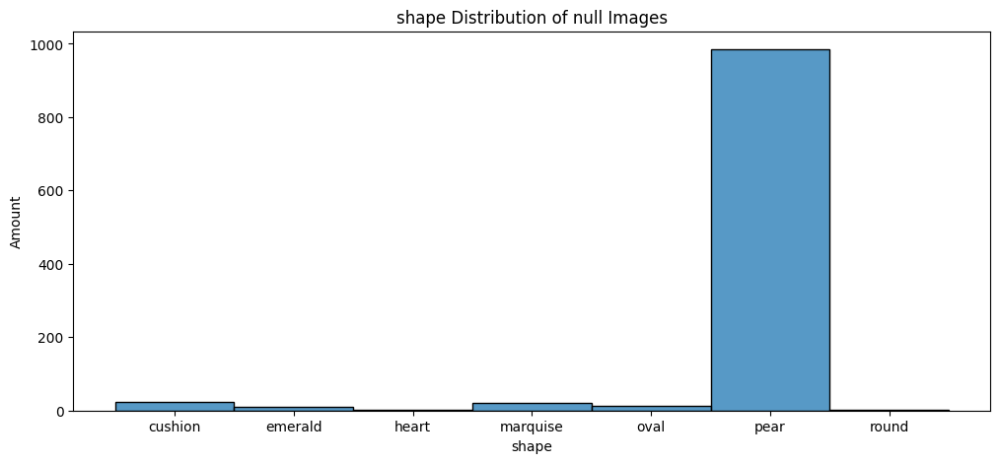

In [12]:
plot_distribution(df_with_nulls,'shape', 'shape Distribution of null Images','shape','Amount')

as we can see most of the null values belong to the pear shape.

In [13]:
value_counts = dataframe['shape'].value_counts()
print(value_counts)

shape
round       21032
oval         6492
cushion      5341
pear         4338
princess     3949
heart        3756
emerald      3391
marquise      465
Name: count, dtype: int64


the amount of the null images belong to each shape is negligible except the pear shape which constitutes about 22% of the pear data.
we will need to consider if we can drop them, For now I would prefer to remove them because it will be more convenient to work that way and if the need arises we will deal with them later.

In [14]:
dataframe = dataframe.dropna()

Now we will go over the data and see the types of possible values, we will check their uniformity for a certain form of presentation and explain a little about the differences

In [15]:
shape_unique_samples = dataframe.drop_duplicates(subset=['shape'])
carat_unique_samples = dataframe.drop_duplicates(subset=['carat'])
clarity_unique_samples = dataframe.drop_duplicates(subset=['clarity'])
colour_unique_samples = dataframe.drop_duplicates(subset=['colour'])
cut_unique_samples = dataframe.drop_duplicates(subset=['cut'])
polish_unique_samples = dataframe.drop_duplicates(subset=['polish'])
symmetry_unique_samples = dataframe.drop_duplicates(subset=['symmetry'])
fluorescence_unique_samples = dataframe.drop_duplicates(subset=['fluorescence'])
length_unique_samples = dataframe.drop_duplicates(subset=['length'])
width_unique_samples = dataframe.drop_duplicates(subset=['width'])
depth_unique_samples = dataframe.drop_duplicates(subset=['depth'])

In [16]:
shape_unique_samples = shape_unique_samples[['path_to_img','shape']]
carat_unique_samples = carat_unique_samples[['path_to_img','carat']]
clarity_unique_samples = clarity_unique_samples[['path_to_img','clarity']]
colour_unique_samples = colour_unique_samples[['path_to_img','colour']]
cut_unique_samples = cut_unique_samples[['path_to_img','cut']]
polish_unique_samples = polish_unique_samples[['path_to_img','polish']]
symmetry_unique_samples = symmetry_unique_samples[['path_to_img','symmetry']]
fluorescence_unique_samples = fluorescence_unique_samples[['path_to_img','fluorescence']]
length_unique_samples = length_unique_samples[['path_to_img','length']]
width_unique_samples = width_unique_samples[['path_to_img','width']]
depth_unique_samples = depth_unique_samples[['path_to_img','depth']]

In [17]:
import numpy as np

def plot_diamonds(data_frame, image_title_column, images_in_row = 10):
        # Parameters
    total_images = len(data_frame)
    desired_rows = int(total_images / images_in_row)
    if total_images % images_in_row :
        desired_rows = desired_rows + 1 
    
    # Calculate the number of columns
    num_columns = int(np.ceil(total_images / desired_rows))
    
    # Plot images
    fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
    axes = axes.flatten()  # Flatten the array of axes for easy iteration
    
    # Display images
    for i in range(total_images):
        img_path = data_frame.iloc[i]['path_to_img']
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide axis
        axes[i].set_title(f'{df_sorted.iloc[i][image_title_column]}')
    
    # Hide any unused axes
    for ax in axes[total_images:]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

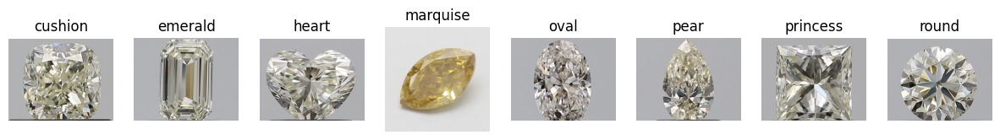

In [18]:
from PIL import Image

# Number of images to display
num_images = len(shape_unique_samples)

# Plot images
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
for i, ax in enumerate(axes):
    img_path = shape_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')  # Hide axis
    ax.set_title(f'{shape_unique_samples.iloc[i]['shape']}')

plt.show()

Here we can see the eight types of shapes we will work with: cushion, emerald, heart, marquise, oval, pear, princess and round.

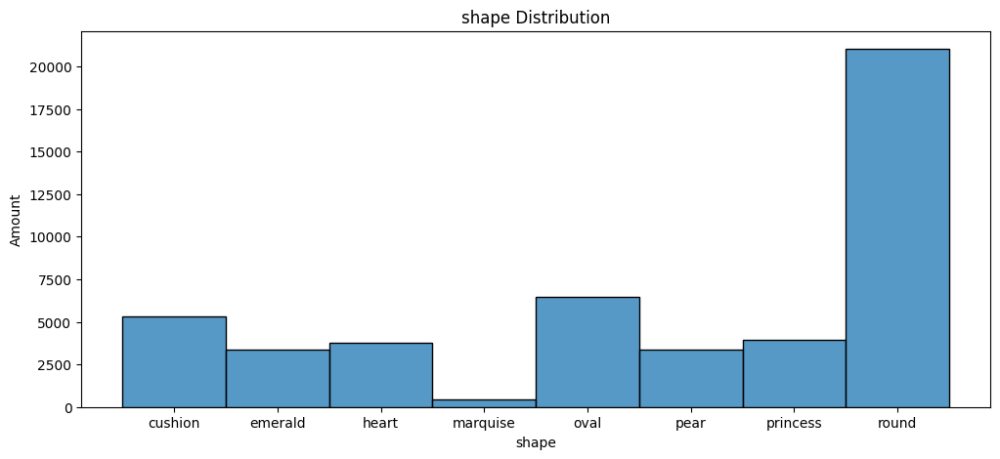

In [19]:
plot_distribution(dataframe,'shape', 'shape Distribution','shape','Amount')

Most of the shapes has between 3000 to 5000 images except the marquise shape with less than a 1000 and the round shape with more than 20000.
we need to figure out how that affect our classification.

In [20]:
clarity_unique_samples = clarity_unique_samples.sort_values(by='clarity', ascending=True)
print(clarity_unique_samples['clarity'])

7778       FL
766        I1
120        I2
43750      I3
43179      I4
37749      I5
36549      I6
35405      I7
368        IF
2         SI1
0         SI2
45777    SI2-
44658     SI3
7         VS1
3         VS2
22       VVS1
58       VVS2
Name: clarity, dtype: object


The image number 45777 has a value of "SI2-" which is incorrect and supposed to be "SI2", we will fix that.

In [21]:
dataframe['clarity'] = dataframe['clarity'].replace('SI2-', 'SI2')
clarity_unique_samples = dataframe.drop_duplicates(subset=['clarity'])
clarity_unique_samples = clarity_unique_samples[['path_to_img','clarity']]
clarity_unique_samples = clarity_unique_samples.sort_values(by='clarity', ascending=True)

In [22]:
# Define the custom order
custom_order = ['FL','IF','VVS1','VVS2','VS1','VS2','SI1','SI2','SI3','I1','I2','I3','I4','I5','I6','I7']

# Convert the 'Name' column to a categorical type with the custom order
clarity_unique_samples['clarity'] = pd.Categorical(clarity_unique_samples['clarity'], categories=custom_order, ordered=True)

# Sort the DataFrame by the custom order
df_sorted = clarity_unique_samples.sort_values(by='clarity')

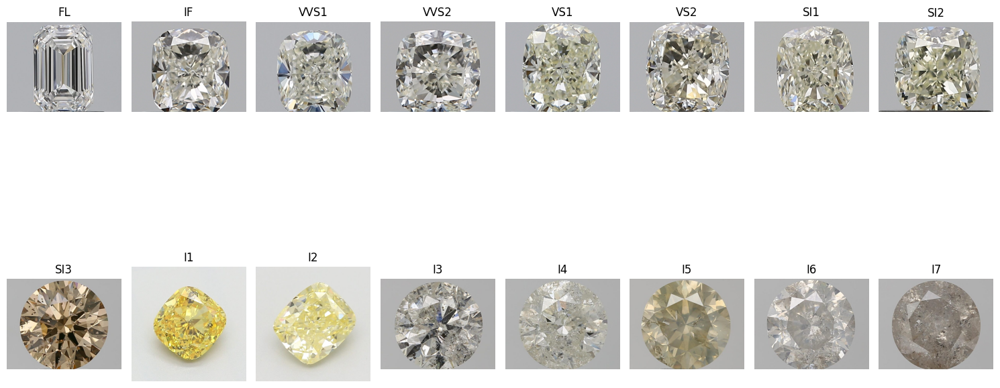

In [23]:
plot_diamonds(df_sorted, 'clarity')

clarity scale in descending order:FL,IF,VVS1,VVS2,VS1,VS2,SI1,SI2,SI3,I1,I2,I3,I4,I5,I6,I7.
Here we can see that the more we go up in the clarity level, the less cloudy the diamond looks.

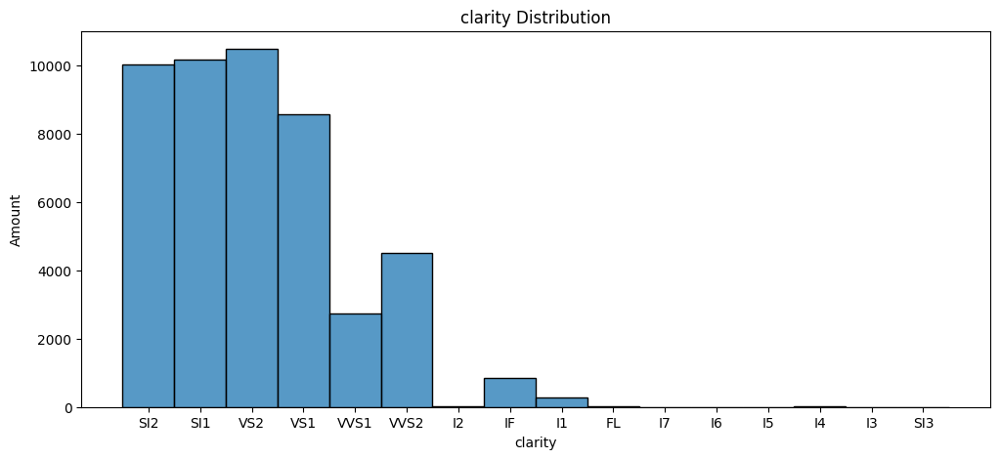

In [24]:
plot_distribution(dataframe,'clarity', 'clarity Distribution','clarity','Amount')

Most of our images contains the VVS1,VVS2,VS1,VS2,SI1,SI2 clarity rating and barely any of the rest.

In [25]:
colour_unique_samples = colour_unique_samples.sort_values(by='colour', ascending=True)
print(colour_unique_samples['colour'])

261           D
35667    D:P:BN
176           E
273           F
34        FANCY
34607      FC:P
76            G
95            H
78            I
38601       I:P
21            J
5             K
2             L
3             M
0             N
2089        O-P
4132        Q-R
14          S-T
16          U-V
15          W-X
1           Y-Z
Name: colour, dtype: object


Diamonds beyond the Z grade enter the realm of fancy colors, which are graded differently and include vivid hues of yellow, brown, pink, blue, green, and other colors. Fancy color diamonds are graded based on the intensity and hue of their color rather than the absence of color.

Most of our data does not differentiate between the colors of the FANCY category except for the following three cases: "D:P:BN","FC:P", "I:P", so we will add them to the FANCY category. 

In [26]:
dataframe['colour'] = dataframe['colour'].replace('D:P:BN', 'FANCY')
dataframe['colour'] = dataframe['colour'].replace('FC:P', 'FANCY')
dataframe['colour'] = dataframe['colour'].replace('I:P', 'FANCY')

In [27]:
colour_unique_samples = dataframe.drop_duplicates(subset=['colour'])
colour_unique_samples = colour_unique_samples[['path_to_img','colour']]
colour_unique_samples = colour_unique_samples.sort_values(by='colour', ascending=True)
#print(colour_unique_samples['colour'])

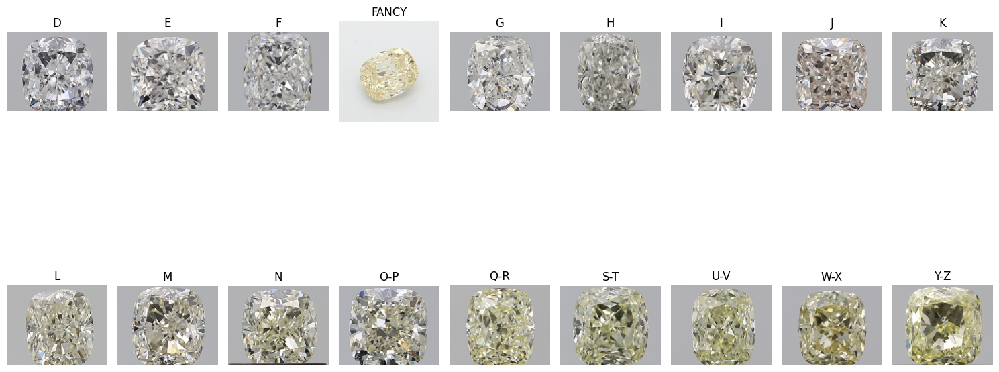

In [28]:
# Parameters
total_images = len(colour_unique_samples)
desired_rows = 2  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = colour_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{colour_unique_samples.iloc[i]['colour']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

we can see in the above pictures how the colour turns from Absolutely colorless to Light yellow or brown tint as the letters hoes up.
except the FANCY colour which is still yellowish, but a bit different from the rest.

In [29]:
fancy_df = dataframe[dataframe['colour'] == 'FANCY']
random_rows = fancy_df.sample(n=30)

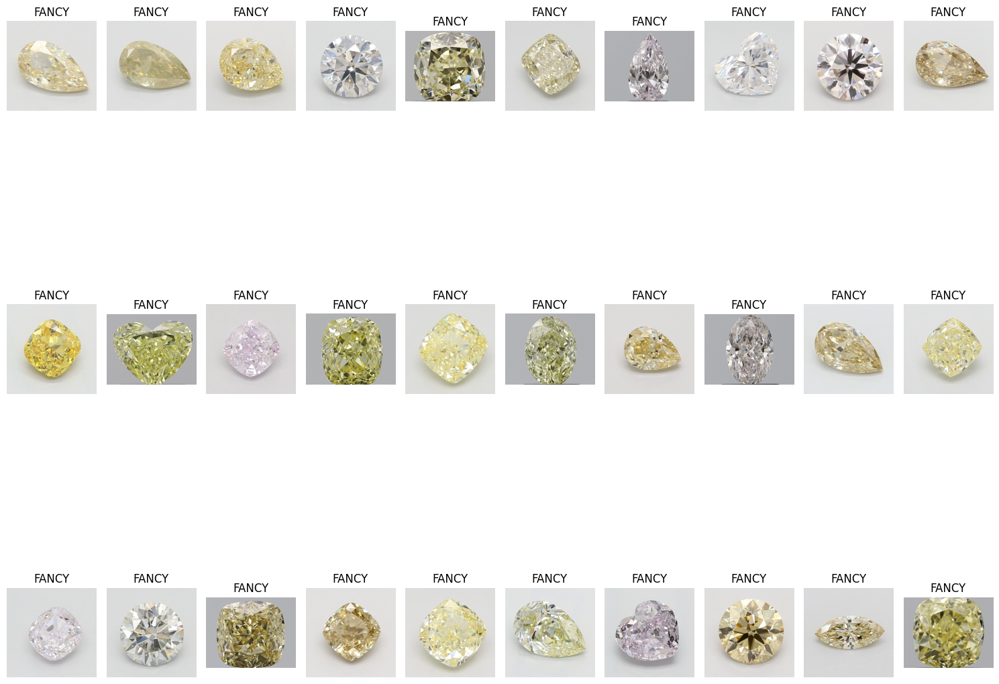

In [30]:
# Parameters
total_images = len(random_rows)
desired_rows = 3  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = random_rows.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{random_rows.iloc[i]['colour']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

our FANCY colours consist most of yellow and pink colours.

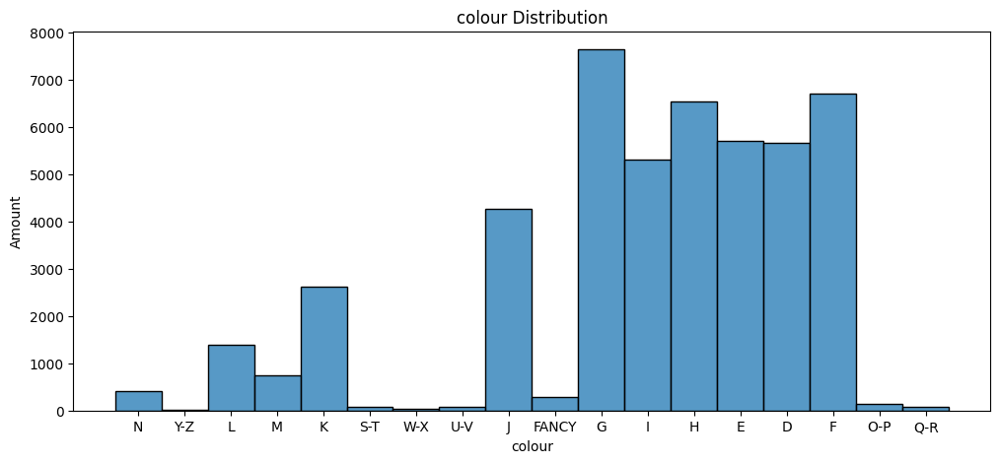

In [31]:
plot_distribution(dataframe,'colour', 'colour Distribution','colour','Amount')

As the rating letters goes up we have less and less images.

In [32]:
print(cut_unique_samples['cut'])

0           VG
1           EX
5           FG
18          GD
20505    IDEAL
27794        F
Name: cut, dtype: object


The term "Ideal cut" is often used by various gemological organizations and diamond retailers to describe diamonds that have been cut to proportions that maximize brilliance and fire. While the Gemological Institute of America (GIA) uses the term "Excellent" as its highest cut grade, other grading laboratories, such as the American Gem Society (AGS), use the term "Ideal" for their highest cut grade.
There are other grading systems which include intermediate values such as FG that stands for Fair-Good.

lets convert the IDEAL cut to EX for uniformity.

In [33]:
dataframe['cut'] = dataframe['cut'].replace('IDEAL', 'EX')
cut_unique_samples = dataframe.drop_duplicates(subset=['cut'])
cut_unique_samples = cut_unique_samples[['path_to_img','cut']]
cut_unique_samples = cut_unique_samples.sort_values(by='cut', ascending=True)
print(cut_unique_samples['cut'])

1        EX
27794     F
5        FG
18       GD
0        VG
Name: cut, dtype: object


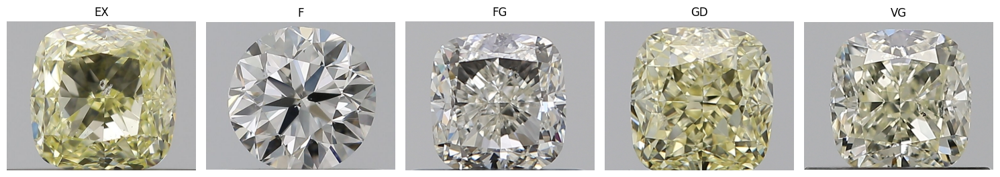

In [34]:
# Parameters
total_images = len(cut_unique_samples)
desired_rows = 1  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = cut_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{cut_unique_samples.iloc[i]['cut']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

Cut Components: The cut grade considers factors such as brightness, fire, scintillation, weight ratio, durability, polish, and symmetry.
Brightness: The amount of white light reflected from the diamond.
Fire: The dispersion of light into the colors of the spectrum.
Scintillation: The sparkle when the diamond moves.
Polish: The overall smoothness of the diamond’s surface.
Symmetry: The precision of the diamond’s cut and the alignment of its facets.
As a result, it is difficult for an untrained person to see the differences and even more so when trying from a picture.

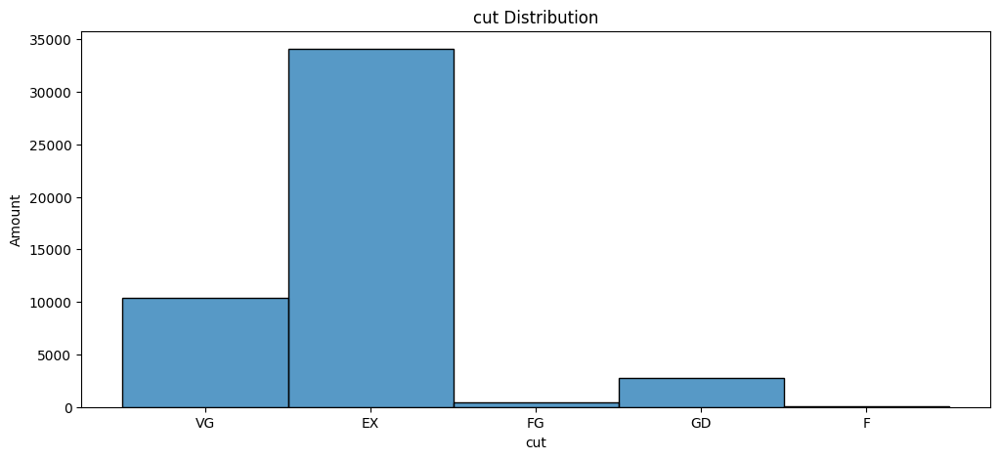

In [35]:
plot_distribution(dataframe,'cut', 'cut Distribution','cut','Amount')

We barely have any Fair cut images.

In [36]:
print(polish_unique_samples['polish'])

0      EX
6      VG
214    GD
Name: polish, dtype: object


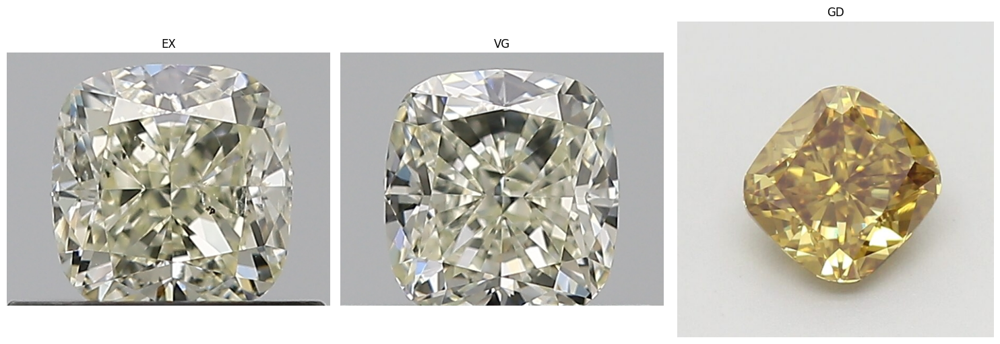

In [37]:
# Parameters
total_images = len(polish_unique_samples)
desired_rows = 1  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = polish_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{polish_unique_samples.iloc[i]['polish']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

Diamond polish is an important aspect of a diamond's overall cut quality. It refers to the smoothness of the diamond's surface and the quality of the finish on the facets. Poor polish can affect the diamond's brilliance  and overall appearance. 
using the following categories:Excellent - EX, Very Good - VG, Good - G, Fair -F, Poor - PR.
at the pictures above we can see the diamond's polish diffrences in emphasis on the briliance.

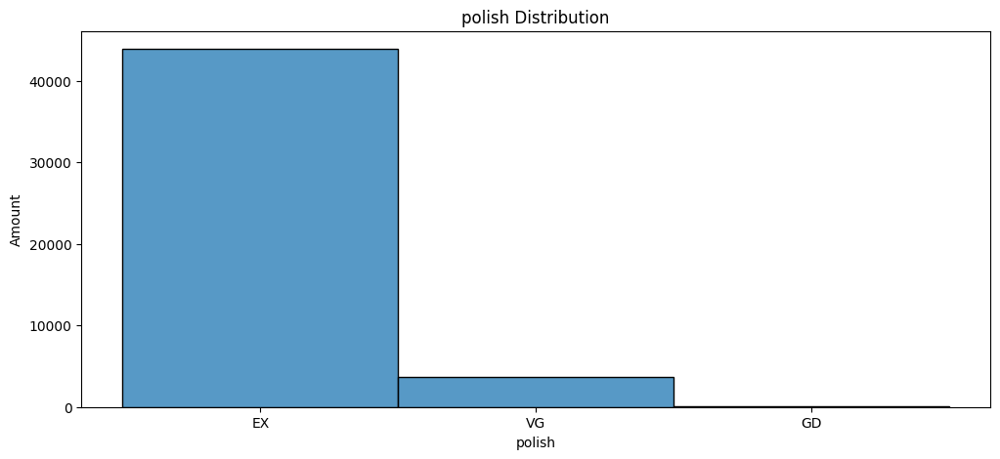

In [38]:
plot_distribution(dataframe,'polish', 'polish Distribution','polish','Amount')

Most of our samples are concentrated in the EX rating area and there are almost no pictures of the GD rating

In [39]:
print(symmetry_unique_samples['symmetry'])

0        VG
9        EX
13       GD
3241      G
5346      F
16981    PR
Name: symmetry, dtype: object


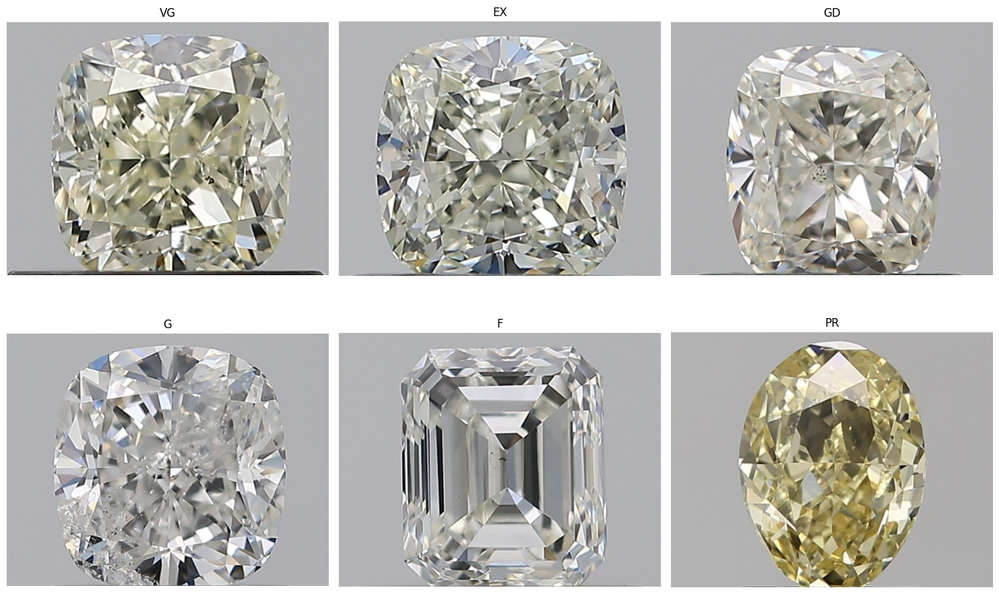

In [40]:
# Parameters
total_images = len(symmetry_unique_samples)
desired_rows = 2  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = symmetry_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{symmetry_unique_samples.iloc[i]['symmetry']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

Diamond symmetry is an important aspect of a diamond's overall cut quality. It refers to the precision and alignment of the diamond's facets, which can affect the stone's brilliance and visual appeal.
using the following categories:Excellent - EX, Very Good - VG, Good - G, Fair -F, Poor - PR.
at the pictures above we can see the diamond's symmetry diffrences, Starting with the stone with the grade POOR where we can really see an unequal cut in the middle, and in the stone with the grade FAIR where the spaces between the cutting lines are unequal on both sides of the stone to the stone with the grade EXCELENT where the cutting is complex and very symmetrical

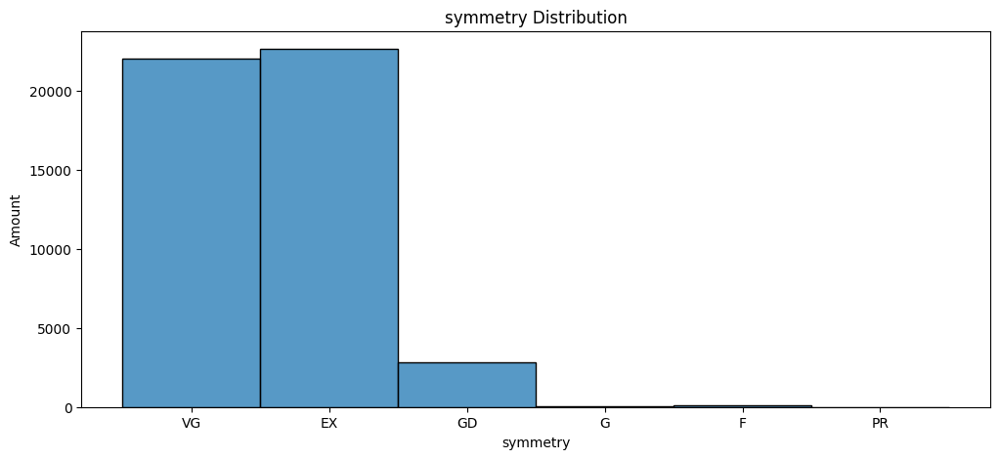

In [41]:
plot_distribution(dataframe,'symmetry', 'symmetry Distribution','symmetry','Amount')

Most of our samples are concentrated in the EX and VG rating area and there are almost no pictures of the other ratings

In [42]:
print(fluorescence_unique_samples['fluorescence'])

0             N
1             F
10           ST
15            M
263          VS
2397        VSL
2830         SL
20505      NONE
35667       MED
38601    SLIGHT
Name: fluorescence, dtype: object


Diamond fluorescence refers to the glow that some diamonds emit when exposed to ultraviolet (UV) light. This fluorescence can affect a diamond’s appearance under certain lighting conditions.
using the following categories: None - N, Faint - F, Medium - M, Strong - S, Very Strong - VS .
However, it is possible to encounter the term "Slight" in other grading systems, such as the American Gem Society (AGS) or in the vernacular used by certain jewelers. This term is typically equivalent to "Faint" fluorescence in the GIA system.
 "Slight" and "Very Slight" (VSL) are often used interchangeably by some gemological laboratories and retailers, and they are typically considered equivalent to "Faint" in the GIA system.
 we have inconsistency in the grading method so wi will make the adjustment according to the GIA grading system which most of our images graded by.

In [43]:
dataframe['fluorescence'] = dataframe['fluorescence'].replace('VSL', 'F')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('SL', 'F')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('SLIGHT', 'F')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('MED', 'M')
dataframe['fluorescence'] = dataframe['fluorescence'].replace('NONE', 'N')

fluorescence_unique_samples = dataframe.drop_duplicates(subset=['fluorescence'])
fluorescence_unique_samples = fluorescence_unique_samples[['path_to_img','fluorescence']]
fluorescence_unique_samples = fluorescence_unique_samples.sort_values(by='fluorescence', ascending=True)
print(fluorescence_unique_samples['fluorescence'])

1       F
15      M
0       N
10     ST
263    VS
Name: fluorescence, dtype: object


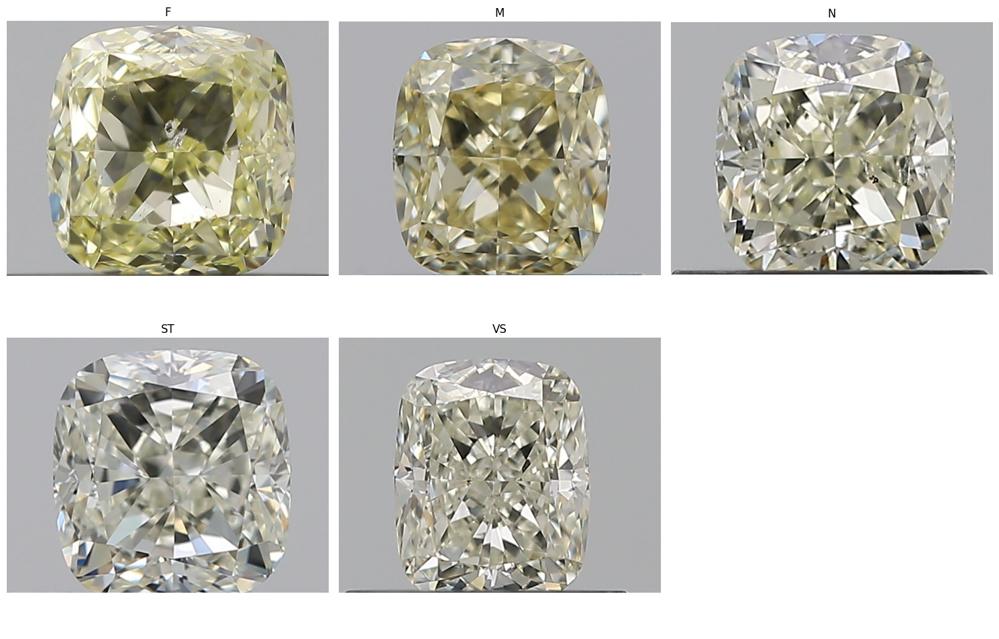

In [44]:
# Parameters
total_images = len(fluorescence_unique_samples)
desired_rows = 2  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = fluorescence_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{fluorescence_unique_samples.iloc[i]['fluorescence']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In most cases, diamond fluorescence is not visible without UV light. Fluorescence is a reaction to ultraviolet light, and under normal lighting conditions, it is usually not detectable. However, there are a few scenarios where fluorescence might affect the appearance of a diamond even in non-UV lighting:

Strong or Very Strong Fluorescence: Diamonds with strong or very strong fluorescence can sometimes appear slightly hazy or oily in daylight or under certain artificial lights. This effect is more noticeable in diamonds with lower color grades (e.g., I, J, K) and can sometimes enhance the diamond's appearance by making it look whiter.

Daylight Sensitivity: Daylight contains a small amount of UV light. Diamonds with strong fluorescence might exhibit a subtle glow or a change in appearance when exposed to natural sunlight.
Therefore we will not be able to see the differences by pictures

The following four attributes: carat, length, width, depth. They are features that deal with the weight and size of the diamond.
I will show samples of each of them in order to see the range of sizes that we have in the dataframe, but we will not be able to see a real difference because the sizes of the images have been adjusted to an almost uniform size.

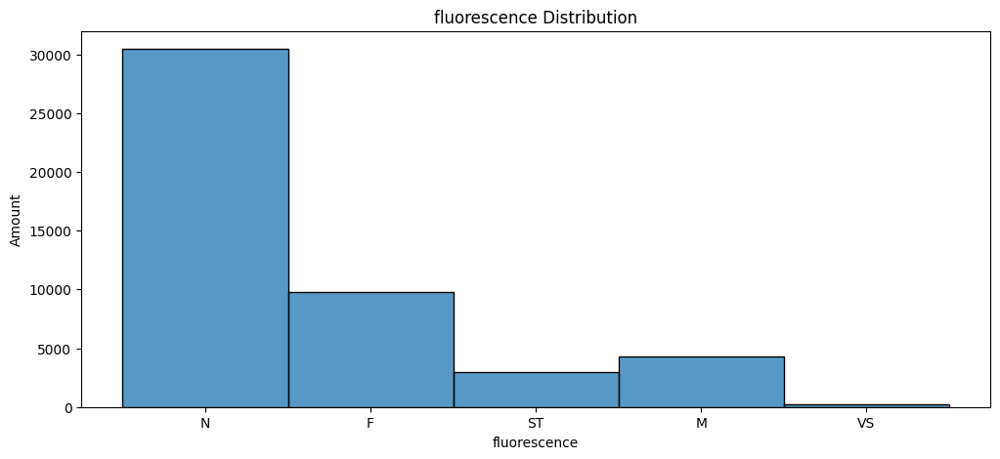

In [45]:
plot_distribution(dataframe,'fluorescence', 'fluorescence Distribution','fluorescence','Amount')

We barely have VS samples but they are quite close and sometimes even identical to the Fair rating, so if it helps we can combine them later

In [46]:
print(dataframe.describe())

              carat        length         width         depth
count  47711.000000  47711.000000  47711.000000  47711.000000
mean       0.949001      6.312485      5.636218      3.606646
std        0.569667      1.431358      1.084442      0.648478
min        0.500000      4.010000      3.440000      2.110000
25%        0.550000      5.160000      4.930000      3.160000
50%        0.750000      6.010000      5.400000      3.500000
75%        1.010000      7.040000      6.270000      3.980000
max        8.000000     16.060000     12.810000      7.960000


here we can see that the carat values are between 0.5-8 but the 50% is 0.76 which suggest most of the values are on the smaller size between 0.5 to 1.
as for the rest its the same behaviour as expected, meaning:
length values are between 4-16 and most of the values are on the smaller size between 4 to 7 (millimeters).
width values are between 3-12 and most of the values are on the smaller size between 3 to 6 (millimeters).
length values are between 2-8 and most of the values are on the smaller size between 2 to 4 (millimeters).

In [47]:
carat_unique_samples.loc[:, 'bin'] = carat_unique_samples['carat'] // 1
carat_unique_samples = carat_unique_samples.drop_duplicates(subset =['bin'])

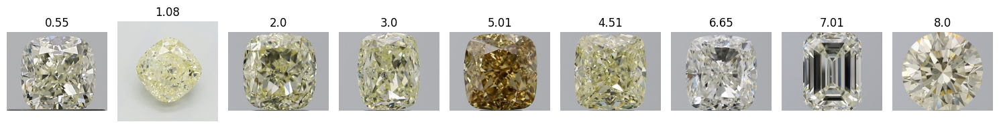

In [48]:
# Parameters
total_images = len(carat_unique_samples)
desired_rows = 1  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = carat_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{carat_unique_samples.iloc[i]['carat']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [49]:
length_unique_samples.loc[:, 'bin'] = length_unique_samples['length'] // 1
length_unique_samples = length_unique_samples.drop_duplicates(subset =['bin'])

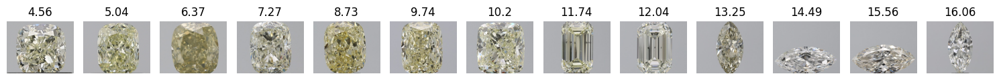

In [50]:
# Parameters
total_images = len(length_unique_samples)
desired_rows = 1  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = length_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{length_unique_samples.iloc[i]['length']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [51]:
width_unique_samples.loc[:, 'bin'] = width_unique_samples['width'] // 1
width_unique_samples = width_unique_samples.drop_duplicates(subset =['bin'])

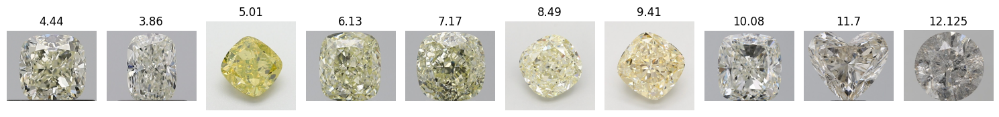

In [52]:
# Parameters
total_images = len(width_unique_samples)
desired_rows = 1  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = width_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{width_unique_samples.iloc[i]['width']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [53]:
depth_unique_samples.loc[:, 'bin'] = depth_unique_samples['depth'] // 1
depth_unique_samples = depth_unique_samples.drop_duplicates(subset =['bin'])

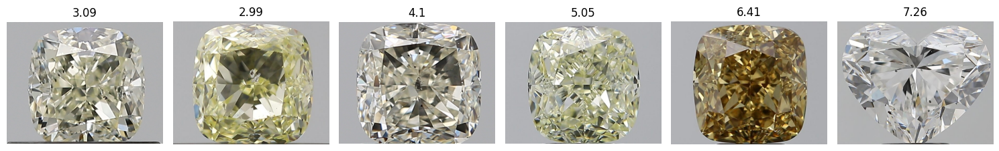

In [54]:
# Parameters
total_images = len(depth_unique_samples)
desired_rows = 1  # Number of rows you want to display

# Calculate the number of columns
num_columns = int(np.ceil(total_images / desired_rows))

# Plot images
fig, axes = plt.subplots(desired_rows, num_columns, figsize=(15, 5 * desired_rows))
axes = axes.flatten()  # Flatten the array of axes for easy iteration

# Display images
for i in range(total_images):
    img_path = depth_unique_samples.iloc[i]['path_to_img']
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axis
    axes[i].set_title(f'{depth_unique_samples.iloc[i]['depth']}')

# Hide any unused axes
for ax in axes[total_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

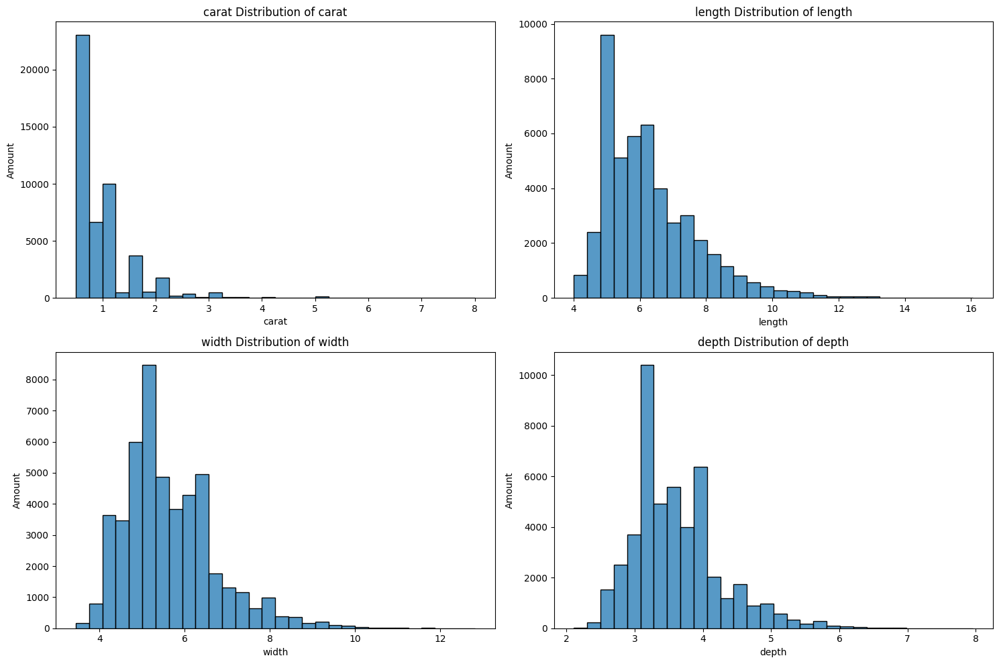

In [55]:
columns_of_sizes = ['carat','length','width','depth']

# Calculate the number of rows and columns for the subplots grid
n_cols = 2  
n_rows = 2 

# Create subplots 
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Plot distributions
for i, label in enumerate(columns_of_sizes):
    label_data = dataframe[label]
    sns.histplot(label_data, bins=30, ax=axes[int(i/n_cols), i%n_cols])
    axes[int(i/n_cols), i%n_cols].set_title(f'{label} Distribution of {label}')
    axes[int(i/n_cols), i%n_cols].set_xlabel(label)
    axes[int(i/n_cols), i%n_cols].set_ylabel('Amount')
plt.tight_layout()
plt.show()

It can be seen that in all four of these characteristics, the quantity is large when it comes to the small sizes but gets smaller as the sizes are smaller.
And it makes sense since the weight indicates the amount of material that is characterized by a different size when it comes to the same type of material.
That is, we will expect to see a connection between these characteristics and therefore we may be able to reduce them.

### Image analysis

In [56]:
column_names = dataframe.columns.tolist()
column_names.remove('path_to_img')

In [61]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

Mean pixel values refer to the average intensity or color value of all the pixels in a given image or a specific region of an image. These values provide a statistical measure of the overall brightness or color of the image.
Image contrast refers to the difference in luminance or color that makes an object distinguishable from other objects and the background. High contrast images have a wide range of tones and colors from the darkest blacks to the brightest whites, making details more discernible. Low contrast images, on the other hand, have a narrow range of tones, resulting in a more muted or washed-out appearance where details might be harder to see. Contrast is an important aspect in image processing and photography as it affects the clarity and visual appeal of an image.
The standard deviation for a color channel in an image is a measure of how much the pixel values in that channel vary from the mean value of the channel. It provides insight into the contrast and variability of the color in the image.
Why Compute Standard Deviation for Each Color Channel?
Contrast Measurement: High standard deviation indicates high contrast, while low standard deviation indicates low contrast.
Color Consistency: Helps in identifying whether an image has consistent color distribution.
Anomaly Detection: Useful for detecting unusual images with abnormal color distributions.

In [62]:
# Function to compute mean and standard deviation for each color channel
def compute_color_statistics(image):
    # Split the image into its color channels
    channels = cv2.split(image)
    stats = {}
    for i, channel in enumerate(['Blue', 'Green', 'Red']):
        mean = np.mean(channels[i])
        std_dev = np.std(channels[i])
        stats[channel] = (mean, std_dev)
    return stats

In [63]:
# Function to find outliers based on color channel statistics
def find_color_outliers(statistics, threshold=3):
    means = {channel: [] for channel in ['Blue', 'Green', 'Red']}
    std_devs = {channel: [] for channel in ['Blue', 'Green', 'Red']}
    
    for stat in statistics:
        for channel in ['Blue', 'Green', 'Red']:
            means[channel].append(stat[channel][0])
            std_devs[channel].append(stat[channel][1])
    
    outliers = []
    for channel in ['Blue', 'Green', 'Red']:
        mean_of_means = np.mean(means[channel])
        std_of_means = np.std(means[channel])
        channel_outliers = [i for i, mean in enumerate(means[channel]) if abs(mean - mean_of_means) > threshold * std_of_means]
        outliers.extend(channel_outliers)
    
    # Removing duplicates
    outliers = list(set(outliers))
    return outliers

In [74]:
%%time

# Function to get image statistics
def get_image_statistics(image_paths):
    statistics = []
    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is not None:
            statistics.append(compute_color_statistics(img))
    return statistics

# Get statistics of all images
statistics = get_image_statistics(image_paths)

CPU times: total: 6min 4s
Wall time: 11min 28s


In [75]:
%%time

# Identify outliers
outliers = find_color_outliers(statistics)

CPU times: total: 62.5 ms
Wall time: 133 ms


In [79]:
print(len(outliers))

682


In [ ]:
image_paths = image_paths.reset_index(drop=True)
outlier_files = [image_paths[i] for i in outliers]

print("Outlier images:\n", outlier_files)

In [83]:
df = pd.DataFrame(outlier_files, columns=['path_to_img'])
merged_df = pd.merge(df, dataframe, on='path_to_img', how='inner')

In [95]:
merged_df.head()

,path_to_img,shape,carat,clarity,colour,cut,polish,symmetry,fluorescence,length,width,depth
0,web_scraped/cushion/2042329.jpg,cushion,0.52,SI2,Y-Z,EX,EX,VG,F,4.40,4.31,2.99
1,web_scraped/round/2116350.jpg,round,0.70,VVS2,F,VG,EX,VG,ST,5.73,5.80,3.37
2,web_scraped/round/2041777.jpg,round,0.50,SI1,FANCY,VG,EX,GD,N,4.92,4.99,3.18
3,web_scraped/emerald/221063-293.jpg,emerald,1.09,VS1,E,EX,EX,EX,N,6.69,4.96,3.37
4,web_scraped/cushion/220070-157.jpg,cushion,2.36,SI2,U-V,EX,EX,VG,F,7.30,7.17,4.99


In [85]:
value_counts = merged_df['shape'].value_counts()
print(value_counts)

shape
emerald     212
round       202
cushion     156
pear         43
oval         34
heart        18
princess     14
marquise      3
Name: count, dtype: int64


In [88]:
%%time

def is_blurry(image, threshold=100):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    variance = cv2.Laplacian(gray, cv2.CV_64F).var()
    return variance < threshold

blurry_images = []
for img_path in image_paths:
    img = cv2.imread(img_path)
    if is_blurry(img):
        blurry_images.append(img_path)

CPU times: total: 5min 47s
Wall time: 7min 27s


In [97]:
blurry_images_df = pd.DataFrame(blurry_images, columns=['path_to_img'])

,path_to_img
0,web_scraped/cushion/2026215.jpg
1,web_scraped/cushion/2049207.jpg
2,web_scraped/cushion/1907301.jpg
3,web_scraped/cushion/1829726.jpg
4,web_scraped/cushion/2069017.jpg


In [101]:
blurry_images_merged_df = pd.merge(blurry_images_df, df, on='path_to_img', how='inner')

In [103]:
blurry_merged_df = pd.merge(blurry_images_merged_df, dataframe, on='path_to_img', how='inner')

In [105]:
value_counts = blurry_merged_df['shape'].value_counts()
print(value_counts)

shape
cushion     43
round       30
pear        19
oval         8
heart        5
emerald      1
marquise     1
princess     1
Name: count, dtype: int64


In [106]:
%%time
# original

image_paths = dataframe['path_to_img']

# Function to get image dimensions
def get_image_dimensions(image_paths):
    dimensions = []
    for img_path in image_paths:
        with Image.open(img_path) as img:
            width, height = img.size
            dimensions.append((img_path, width, height))
    return dimensions

# Get dimensions of all images
image_dimensions = get_image_dimensions(image_paths)

# Convert to a DataFrame for easier visualization
df_dimensions = pd.DataFrame(image_dimensions, columns=['path_to_img', 'Width', 'Height'])

CPU times: total: 20.4 s
Wall time: 39.5 s


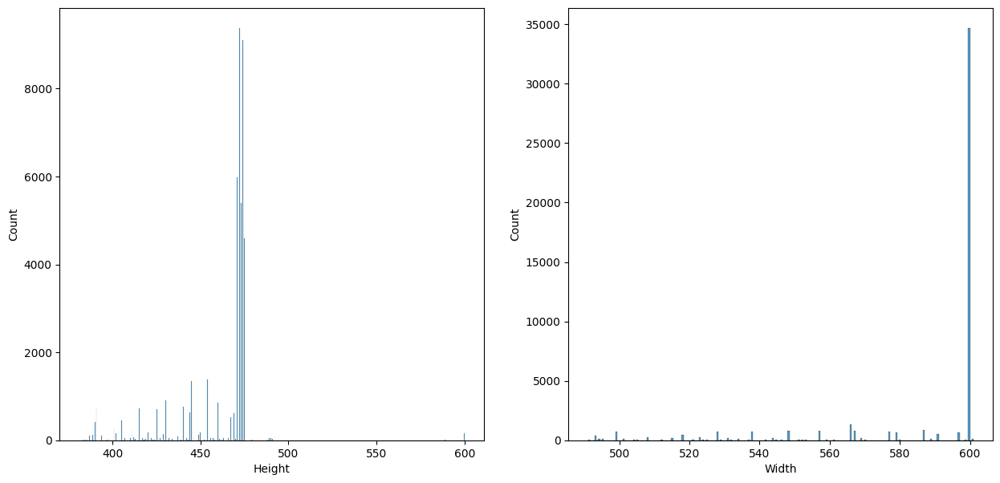

In [107]:
fig, axis = plt.subplots(1, 2, figsize=(15,7))
sns.histplot(df_dimensions['Height'], ax=axis[0])
sns.histplot(df_dimensions['Width'], ax=axis[1])
plt.show()

In [119]:
rezo_df_dimensions = pd.merge(df_dimensions, dataframe[['path_to_img', 'shape']], on='path_to_img', how='inner')

The dimensions of the images are:
Width: between 490 and 610
Height: between 375 and 610
The sizes of the images are not too large, so you can work with them.
The quality of the images is not high, and may not be sufficient for identifying the subtleties between the characteristics of the diamonds.
We shall address the image size problem when we start to design the algorithms.

### Feature Extraction

### Dimensionality Reduction

### Image Clustering

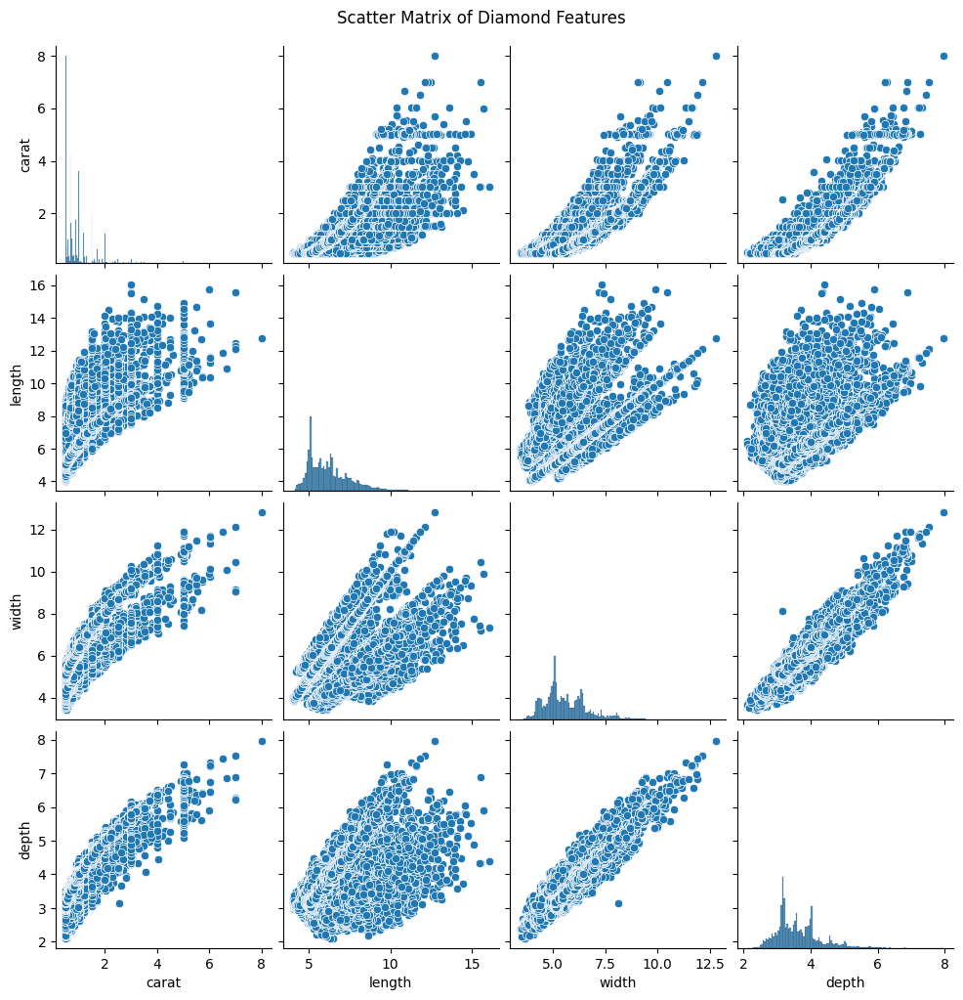

In [71]:
# Selecting relevant columns for the scatter matrix
features = ['carat','length','width','depth']

# Create a scatter matrix
sns.pairplot(dataframe[features])
plt.suptitle('Scatter Matrix of Diamond Features', y=1.02)
plt.show()

## Resizing and Normalization

Data Augmentation and Normalization: I used a series of image transformations from torchvision.transforms to preprocess the images. These transformations include resizing, converting to tensor, and normalizing the pixel values preparing the images for the CNN

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Handle the dataset images , prepare them for the model
The LabelEncoder from sklearn.preprocessing convert categorical string labels into numerical values. This is a preprocessing technique that converts categorical data into a form that can be provided to machine learning algorithms.
since the CNN expect to receive numerical values

In [ ]:
class DiamondDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.df = pd.read_csv(os.path.join(root_dir, csv_file))
        self.root_dir = root_dir
        self.transform = transform
        
        # Initialize LabelEncoders for categorical labels
        self.label_encoders = {}
        for col in ['shape', 'clarity', 'colour', 'symmetry', 'fluorescence']:
            le = LabelEncoder()
            self.df[col] = le.fit_transform(self.df[col])
            self.label_encoders[col] = le

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image_path = self.df.iloc[idx]['path_to_img']
        image = Image.open(image_path).convert('RGB') 
        labels = {
            'shape': self.df.iloc[idx]['shape'],
            'clarity': self.df.iloc[idx]['clarity'],
            'colour': self.df.iloc[idx]['colour'],
            'symmetry': self.df.iloc[idx]['symmetry'],
            'fluorescence': self.df.iloc[idx]['fluorescence'],
            'length': self.df.iloc[idx]['length'],
            'width': self.df.iloc[idx]['width'],
            'depth': self.df.iloc[idx]['depth']
        }
        if self.transform:
            image = self.transform(image)
        return image, labels

In [ ]:
dataset = DiamondDataset(csv_file='diamond_data.csv', root_dir='web_scraped', transform=transform)

dividing the dataset to training set and validation set

In [ ]:
# Uncomment and use the original lines for splitting the full dataset:
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

defining the model to use pre trained resnet18 CNN. 
I used a pre-trained ResNet-18 model from torchvision.models as the base model. ResNet-18 is a type of convolutional neural network (CNN) that is particularly effective for image classification tasks due to its residual learning framework.

In [ ]:
class DiamondMultiOutputModel(nn.Module):
    def __init__(self, num_classes_dict):
        super().__init__()
        self.base_model = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Identity()

        self.output_heads = nn.ModuleDict({
            task: nn.Sequential(
                nn.Flatten(), 
                nn.Linear(num_ftrs, 128),
                nn.ReLU(),
                nn.Dropout(0.5),
                nn.Linear(128, num_classes)
            ) for task, num_classes in num_classes_dict.items()
        })

    def forward(self, x):
        features = self.base_model(x)
        return {task: head(features) for task, head in self.output_heads.items()}

Multi-Output Neural Network: I modified the ResNet-18 model to create a multi-output model by replacing its fully connected layer with multiple task-specific output heads. Each output head is a small neural network responsible for predicting a specific attribute of the diamond.

In [ ]:
num_classes_dict = {
    'shape': len(dataset.df['shape'].unique()),
    'clarity': len(dataset.df['clarity'].unique()),
    'colour': len(dataset.df['colour'].unique()),
    'symmetry': len(dataset.df['symmetry'].unique()),
    'fluorescence': len(dataset.df['fluorescence'].unique()),
    'length': 1,  
    'width': 1,   
    'depth': 1    
}

criterion_dict = {
    'shape': nn.CrossEntropyLoss(),
    'clarity': nn.CrossEntropyLoss(),
    'colour': nn.CrossEntropyLoss(),
    'symmetry': nn.CrossEntropyLoss(),
    'fluorescence': nn.CrossEntropyLoss(),
    'length': nn.MSELoss(),
    'width': nn.MSELoss(),
    'depth': nn.MSELoss()
}

allocating resorces for the model for the training, either CPU or GPU

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Use GPU if available

creating the model and setting an optimizer to assist with the gradient dicent problem
Adam Optimizer: I used the Adam optimizer (torch.optim.Adam) to train the neural network. Adam is an adaptive learning rate optimization algorithm that is widely used in training deep learning models because it combines the benefits of two other extensions of stochastic gradient descent (SGD), specifically AdaGrad and RMSProp.

In [ ]:
model = DiamondMultiOutputModel(num_classes_dict)
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
# Initialize lists to track losses and accuracies
train_losses = []
val_losses = []
train_accuracies = {task: [] for task in num_classes_dict.keys()}
val_accuracies = {task: [] for task in num_classes_dict.keys()}
def calculate_accuracy(outputs, labels):
    _, preds = torch.max(outputs, 1)
    return torch.sum(preds == labels).item() / len(labels)

the actual training, 10 epochs devided to batch since the dataset is large

In [ ]:
for epoch in range(10):
    model.train()
    running_loss = 0.0
    correct_preds = {task: 0 for task in num_classes_dict.keys()}
    total_preds = 0

    # Use tqdm for training loop progress bar
    train_loop = tqdm(train_loader, desc=f'Epoch [{epoch+1}/10] (Training)')
    for batch_idx, (images, labels) in enumerate(train_loop):
        images = images.to(device)
        labels = {k: v.clone().detach().to(device, dtype=torch.long) for k, v in labels.items()}

        optimizer.zero_grad()
        outputs = model(images)

        # Calculate loss for each task
        loss = sum([criterion_dict[task](
            outputs[task], 
            labels[task].float().unsqueeze(1) if task in ['length', 'width', 'depth'] else labels[task]
        ) for task in outputs])

        loss.backward()
        optimizer.step()

        # Update running loss for display in tqdm
        running_loss += loss.item()
        train_loop.set_postfix(loss=running_loss/len(train_loader))
        
        # Calculate accuracy
        for task in outputs.keys():
            if task in ['length', 'width', 'depth']:
                continue  # Skip regression tasks for accuracy calculation
            correct_preds[task] += calculate_accuracy(outputs[task], labels[task])
        total_preds += len(images)
    train_losses.append(running_loss/len(train_loader))
    for task in correct_preds.keys():
        train_accuracies[task].append(correct_preds[task] / total_preds)

    # Validation loop
    model.eval()
    val_loss = 0.0
    correct_preds = {task: 0 for task in num_classes_dict.keys()}
    
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc=f'Epoch [{epoch+1}/10] (Validation)'):
            images = images.to(device)
            labels = {k: v.clone().detach().to(device, dtype=torch.long) for k, v in labels.items()}
            outputs = model(images)
            val_loss += sum([criterion_dict[task](outputs[task], labels[task].float().unsqueeze(1) if task in ['length', 'width', 'depth'] else labels[task]) for task in outputs]).item()
            # Calculate accuracy
            for task in outputs.keys():
                if task in ['length', 'width', 'depth']:
                    continue  # Skip regression tasks for accuracy calculation
                correct_preds[task] += calculate_accuracy(outputs[task], labels[task])
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    for task in correct_preds.keys():
        val_accuracies[task].append(correct_preds[task] / len(val_loader))
        
    print(f'Epoch [{epoch+1}/10], Val Loss: {val_loss:.4f}')

torch.save(model.state_dict(), 'diamond_model.pth')

I assess the model perfomance by the loss and accuracy metrics

In [ ]:
# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot the accuracies for each task
for task in train_accuracies.keys():
    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracies[task], label=f'Training Accuracy - {task}')
    plt.plot(val_accuracies[task], label=f'Validation Accuracy - {task}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Training and Validation Accuracy for {task}')
    plt.legend()
    plt.show()

as we can see, there is good decent of the loss parameter but the other scales are far from the validation.

In [ ]:
from sklearn.calibration import LabelEncoder
import torch.nn.functional as F  

# Load the trained model
model_path = 'diamond_model.pth'

# Load the dataset (only to get unique values for label encoding)
dataset = DiamondDataset(csv_file='diamond_data.csv', root_dir='web_scraped', transform=None)

# Calculate num_classes_dict dynamically (same as in train.py)
num_classes_dict = {
    'shape': len(dataset.df['shape'].unique()),
    'clarity': len(dataset.df['clarity'].unique()),
    'colour': len(dataset.df['colour'].unique()),
    'symmetry': len(dataset.df['symmetry'].unique()),
    'fluorescence': len(dataset.df['fluorescence'].unique()),
    'length': 1,
    'width': 1,
    'depth': 1
}

In [ ]:
model = DiamondMultiOutputModel(num_classes_dict)
model.load_state_dict(torch.load(model_path))
model.eval()  # Set the model to evaluation mode

In [ ]:
# Preprocessing for new images
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# Function to decode predictions
def decode_predictions(outputs, dataset_csv_file='web_scraped/diamond_data.csv'):
    decoded_labels = {}
    df = pd.read_csv(dataset_csv_file)
    for task, output in outputs.items():
        if task in ['length', 'width', 'depth']:
            decoded_labels[task] = output.item()  # Continuous value
        else:
            probabilities = F.softmax(output, dim=1) 
            top_prob, top_idx = torch.topk(probabilities, 1)
            predicted_label = list(df[task].unique())[top_idx.item()]
            probability_percent = round(top_prob.item() * 100, 2)  # Use round() function
            decoded_labels[task] = (predicted_label, probability_percent)
    return decoded_labels

and a good solution is a successful recognition of a diamond, and its features

In [ ]:
image_path = "web_scraped/emerald/214125-54.jpg"

# Load and preprocess the image
image = Image.open(image_path).convert('RGB')  # Ensure RGB format
image = transform(image).unsqueeze(0) 

# Make prediction
with torch.no_grad():  # No gradients needed for inference
    outputs = model(image)

# Decode predictions
predicted_labels = decode_predictions(outputs)

# Print the predicted labels
print("Predicted Diamond Attributes:")
for attribute, value in predicted_labels.items():
    if isinstance(value, tuple):  # Categorical attribute with probability
        print(f"{attribute.capitalize()}: {value[0]} (Probability: {value[1]}%)")
    else:  # Continuous attribute
        print(f"{attribute.capitalize()}: {value}")


Actual Diamond Attributes:
Shape: emerald 
Clarity: SI2
Colour: H 
Symmetry: EX
Fluorescence: N 
Length: 7.74
Width: 5.71
Depth: 3.91

as we can see there is a lack of match between the prediction and the actual data.

I intend to improve the data augmentation by adding more techniques, and adding Confusion Matrix for classification tasks and Regression Plots for regression tasks.
and i want to Implement cross-validation with a different data subsets.
i should experiment with different hyperparameters (learning rate, batch size, number of epochs)